# Human Brain DLPFC

In this exercise, you will explore the spatial organization of the human dorsolateral prefrontal cortex (DLPFC) using dimensionality reduction techniques applied to both raw data and neural network hidden layer activations.



In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import squidpy as sq
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Dimensionality reduction libraries

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Plotting settings
plt.rcParams["figure.figsize"] = (12, 10)
sc.settings.verbosity = 3

/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


Dataset shape: (2688, 18078)
Number of spots: 2688
Number of genes: 18078
Available annotations: ['in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster']


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_27960/3416100277.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", size=1.5)


<Figure size 1000x1000 with 0 Axes>

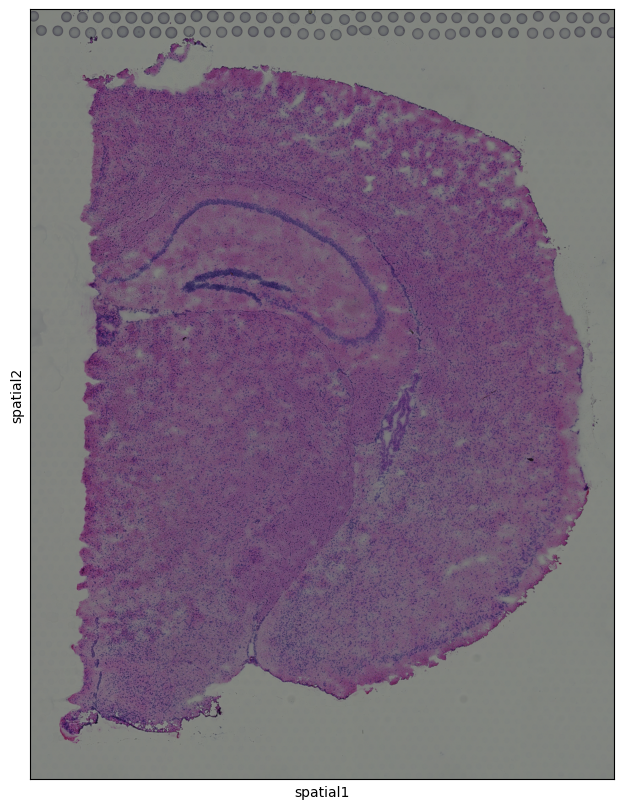

In [2]:
# Load the DLPFC dataset through squidpy's dataset functionality
adata = sq.datasets.visium_hne_adata()

# Basic data exploration
print(f"Dataset shape: {adata.shape}")
print(f"Number of spots: {adata.n_obs}")
print(f"Number of genes: {adata.n_vars}")
print(f"Available annotations: {list(adata.obs.columns)}")

# View tissue image with spots overlaid
plt.figure(figsize=(10, 10))
sc.pl.spatial(adata, img_key="hires", size=1.5)

# If annotation is available, visualize with layer annotation
if "layer_guess" in adata.obs.columns:
    plt.figure(figsize=(10, 10))
    sc.pl.spatial(adata, color="layer_guess", size=1.5)

In [3]:
# Display the first few entries of the gene expression matrix
print("Gene expression matrix (first 5 spots, first 5 genes):")
print(adata.X[0:5, 0:5].toarray())

# Display spatial coordinates
print("\nSpatial coordinates (first 5 spots):")
print(adata.obsm["spatial"][0:5])

# Check available layers in the AnnData object
print("\nAvailable layers:", list(adata.layers.keys()))

# Check available metadata
print("\nSpot metadata:")
print(adata.obs.head())

# Check gene metadata
print("\nGene metadata:")
print(adata.var.head())

Gene expression matrix (first 5 spots, first 5 genes):
[[0.         0.         0.87893134 0.87893134 1.3393729 ]
 [0.         0.         1.0922161  1.0922161  1.0922161 ]
 [0.         0.         0.         0.         0.9803591 ]
 [0.         0.         0.         0.         0.        ]
 [0.         0.         0.99697125 0.         0.6179012 ]]

Spatial coordinates (first 5 spots):
[[8230 7237]
 [4170 1611]
 [2519 8315]
 [7679 2927]
 [3138 6280]]

Available layers: []

Spot metadata:
                    in_tissue  array_row  array_col  n_genes_by_counts  \
AAACAAGTATCTCCCA-1          1         50        102               4928   
AAACAATCTACTAGCA-1          1          3         43               3448   
AAACACCAATAACTGC-1          1         59         19               6022   
AAACAGAGCGACTCCT-1          1         14         94               4311   
AAACCGGGTAGGTACC-1          1         42         28               5787   

                    log1p_n_genes_by_counts  total_counts  log1p_to

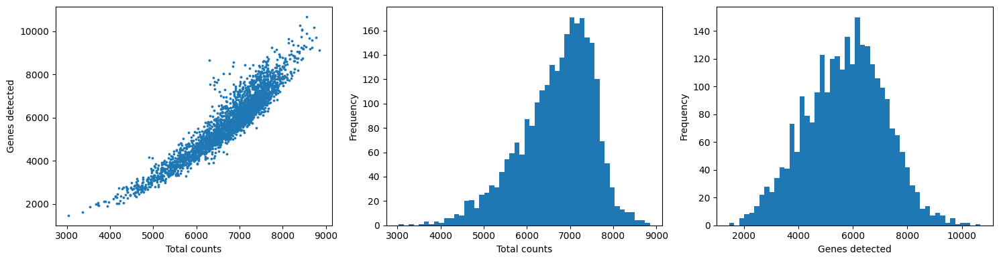

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Number of highly variable genes: 2000


<Figure size 800x600 with 0 Axes>

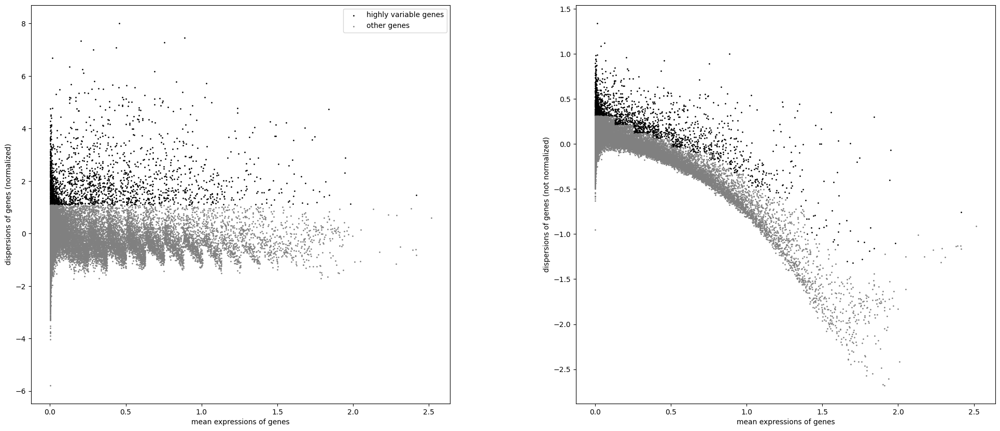

Filtered data shape: (2688, 2000)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:00)


/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:317: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


<Figure size 1000x800 with 0 Axes>

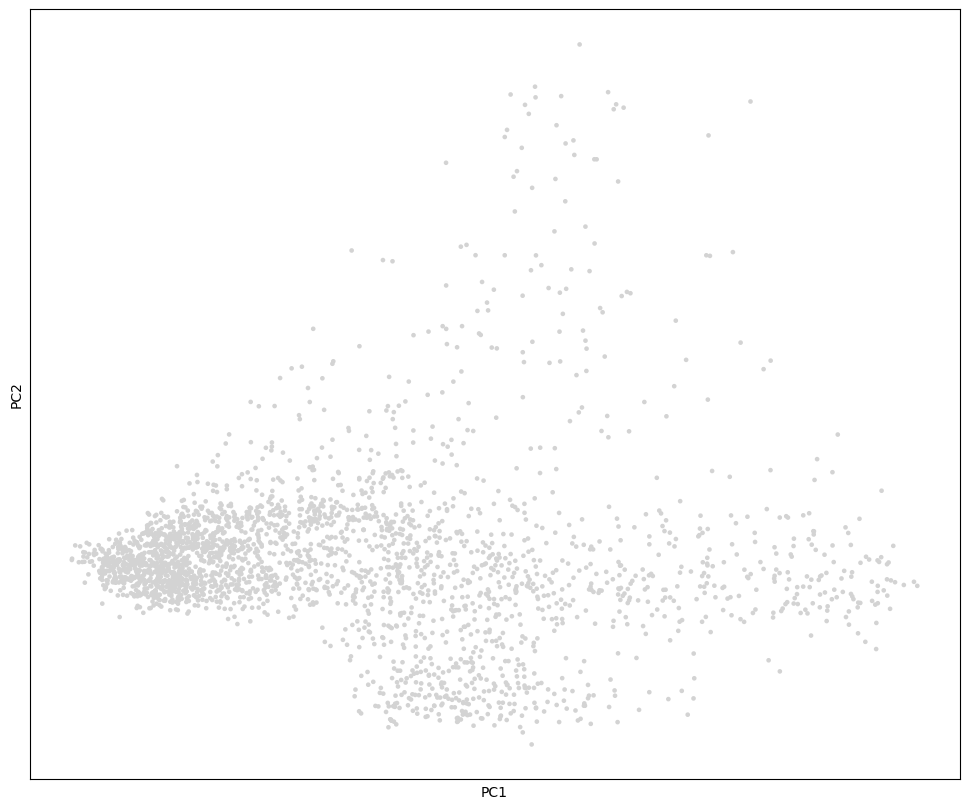

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE


/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: inval

    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:03)


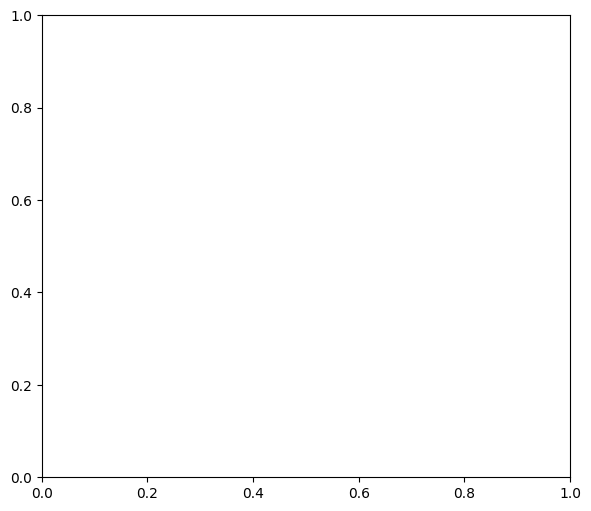

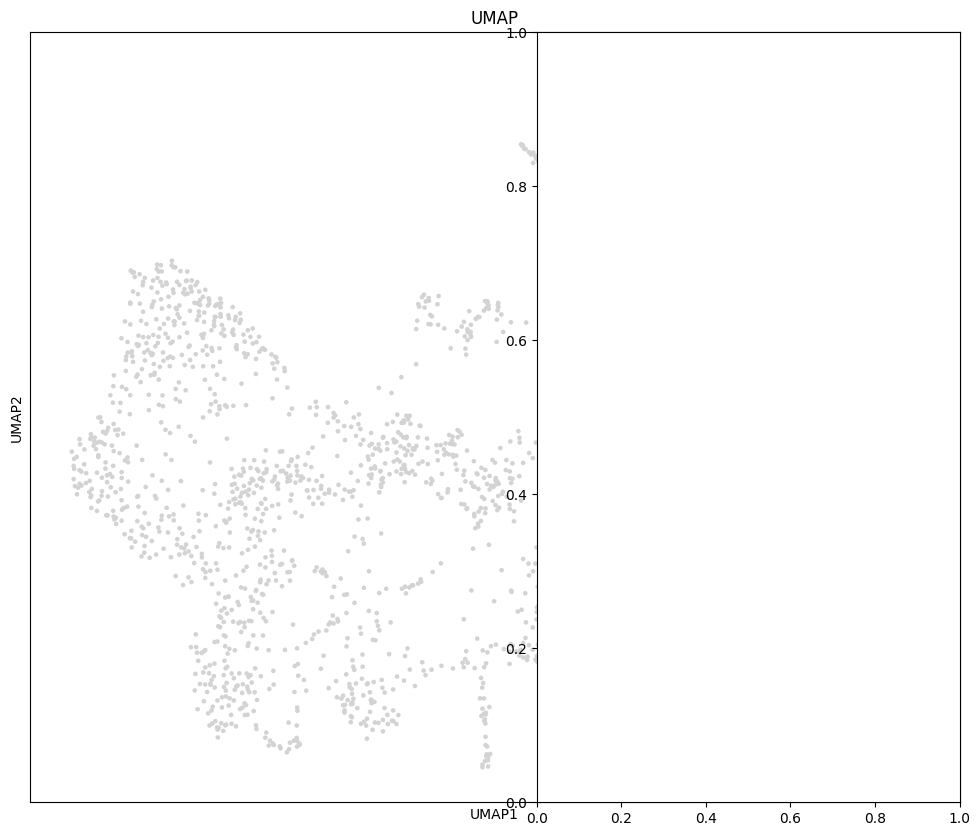

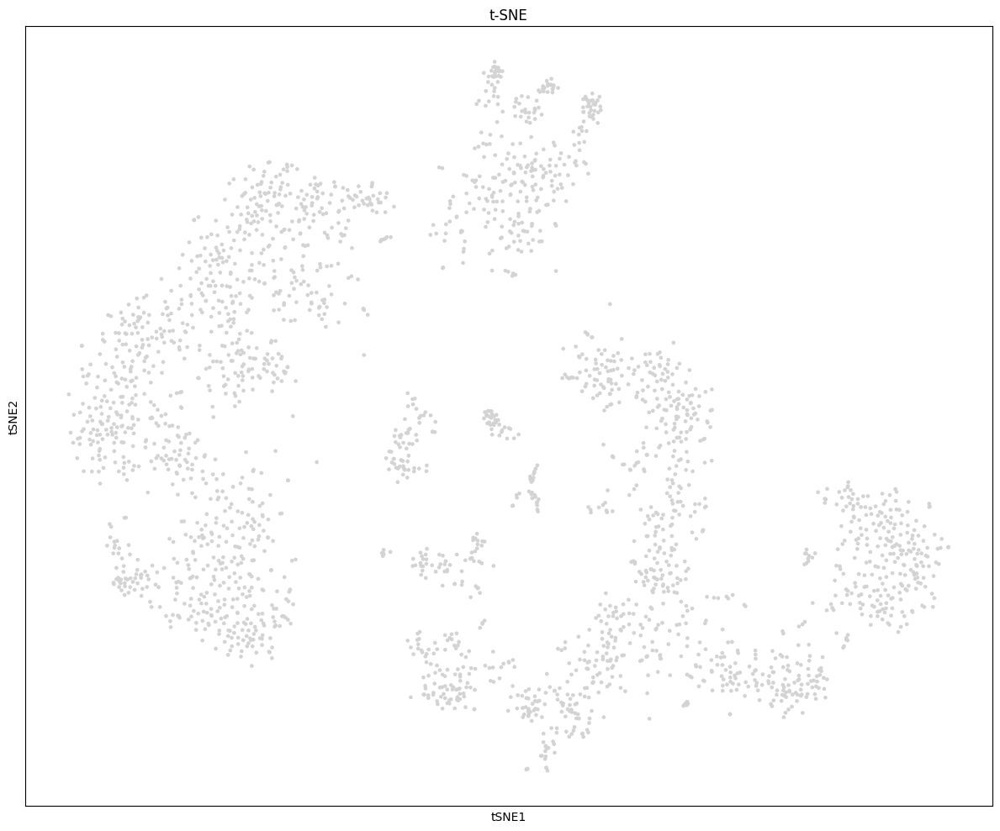

running Leiden clustering


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_27960/1222057805.py:91: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_hvg)


    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
Number of clusters: 20


In [4]:
# Quality control
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

# Visualize QC metrics
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.scatter(adata.obs.total_counts, adata.obs.n_genes_by_counts, s=3)
plt.xlabel("Total counts")
plt.ylabel("Genes detected")
plt.subplot(1, 3, 2)
plt.hist(adata.obs.total_counts, bins=50)
plt.xlabel("Total counts")
plt.ylabel("Frequency")
plt.subplot(1, 3, 3)
plt.hist(adata.obs.n_genes_by_counts, bins=50)
plt.xlabel("Genes detected")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Filter out spots with low quality if needed
# sc.pp.filter_cells(adata, min_genes=200)
# sc.pp.filter_genes(adata, min_cells=3)

# Normalize data
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Identify highly variable genes
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
print(f"Number of highly variable genes: {sum(adata.var.highly_variable)}")

# Plot variable genes
plt.figure(figsize=(8, 6))
sc.pl.highly_variable_genes(adata)

# Filter to highly variable genes
adata_hvg = adata[:, adata.var.highly_variable]
print(f"Filtered data shape: {adata_hvg.shape}")

# Scale data
sc.pp.scale(adata_hvg)

# Compute PCA
sc.tl.pca(adata_hvg, svd_solver="arpack")

# Visualize PCA
plt.figure(figsize=(10, 8))
sc.pl.pca(
    adata_hvg, color="layer_guess" if "layer_guess" in adata.obs.columns else None
)

# Compute neighborhood graph
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=30)

# Run UMAP and t-SNE
sc.tl.umap(adata_hvg)
sc.tl.tsne(adata_hvg)

# Visualize embeddings
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
sc.pl.umap(
    adata_hvg,
    color="layer_guess" if "layer_guess" in adata.obs.columns else None,
    show=False,
)
plt.title("UMAP")
plt.subplot(1, 2, 2)
sc.pl.tsne(
    adata_hvg,
    color="layer_guess" if "layer_guess" in adata.obs.columns else None,
    show=False,
)
plt.title("t-SNE")
plt.tight_layout()
plt.show()

# Prepare data for neural network
X = adata_hvg.X.copy()  # Use highly variable genes

# If layer_guess is available, prepare class labels
if "layer_guess" in adata.obs.columns:
    layer_categories = adata.obs["layer_guess"].cat.categories
    y = adata.obs["layer_guess"].cat.codes.values
    Y = to_categorical(y)
    print(f"Number of layers/classes: {len(layer_categories)}")
    print(f"Layer categories: {layer_categories}")
else:
    # If no annotations, we can use clustering
    sc.tl.leiden(adata_hvg)
    y = adata_hvg.obs["leiden"].astype("category").cat.codes.values
    Y = to_categorical(y)
    print(f"Number of clusters: {len(np.unique(y))}")

/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │       512,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 20)             │         1,300 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 530,004 (2.02 MB)

 Trainable params: 530,004 (2.02 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2879 - loss: 2.5020 - val_accuracy: 0.7651 - val_loss: 0.7838
Epoch 2/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7992 - loss: 0.6529 - val_accuracy: 0.8581 - val_loss: 0.4680
Epoch 3/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9024 - loss: 0.3235 - val_accuracy: 0.8767 - val_loss: 0.3718
Epoch 4/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9441 - loss: 0.1894 - val_accuracy: 0.8791 - val_loss: 0.3817
Epoch 5/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9645 - loss: 0.1171 - val_accuracy: 0.8721 - val_loss: 0.3768
Epoch 6/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9720 - loss: 0.0865 - val_accuracy: 0.8953 - val_loss: 0.3772
Epoch 7/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9709 - loss: 0.0926 - val_accuracy: 0.8860 - val_loss: 0.4056
Epoch 8/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9881 - loss: 0.0481 - val_accuracy: 0.8907 - val_loss:

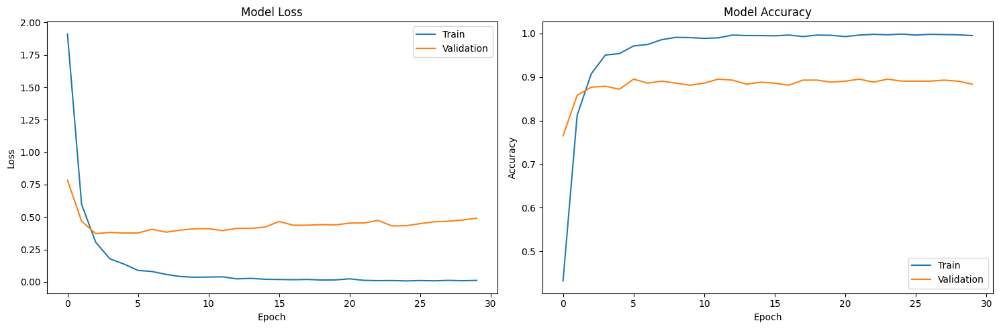

Test Loss: 0.3527
Test Accuracy: 0.9108
Raw data shape: (2150, 2000)
Layer 1 output shape: (2150, 256)
Layer 2 output shape: (2150, 64)


In [5]:
import tensorflow

# Split data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.2, random_state=42
)

# Get number of classes
nb_classes = Y.shape[1]

# Define dropout rate
dropout = 0.3

# Build neural network with 2 hidden layers
model = Sequential()
model.add(Dense(256, activation="relu", input_shape=(X_train.shape[1],)))
model.add(Dropout(dropout))
model.add(Dense(64, activation="relu"))
model.add(Dropout(dropout))
model.add(Dense(nb_classes, activation="softmax"))

# Compile the model
model.compile(loss="categorical_crossentropy", optimizer=Adam(), metrics=["accuracy"])

# Print model summary
model.summary()

# Train the neural network
history = model.fit(
    X_train, Y_train, batch_size=64, epochs=30, verbose=1, validation_split=0.2
)

# Plot training history
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("Model Loss")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="upper right")

plt.subplot(1, 2, 2)
plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])
plt.title("Model Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Train", "Validation"], loc="lower right")
plt.tight_layout()
plt.show()

# Evaluate on test set
loss, accuracy = model.evaluate(X_test, Y_test, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

# Extract hidden layer activations
get_layer_output = tensorflow.keras.Function(
    inputs=[model.layers[0].input],
    outputs=[model.layers[0].output, model.layers[2].output],
)

# Get activations for training and test data
layer1_output, layer2_output = get_layer_output([X_train])
test_layer1_output, test_layer2_output = get_layer_output([X_test])

print(f"Raw data shape: {X_train.shape}")
print(f"Layer 1 output shape: {layer1_output.shape}")
print(f"Layer 2 output shape: {layer2_output.shape}")

## Task Description
1. Project the DLPFC spatial transcriptomics data into a 2-dimensional space using different dimensionality reduction techniques:
- t-SNE
- UMAP
- TriMAP
- PaCMAP (doesn't work actually)
2. Use the neural network’s hidden layer activations to create alternative 2-dimensional projections with the same techniques.

3. Visualize both the standard embeddings and the spatial context of these embeddings.

4. Use the 2-dimensional projections for layer classification:

- Implement k-nearest neighbors to classify the embedded test data
- Compare accuracy across different embedding techniques
- Try with several values of n_neighbors, e.g., [3, 5, 10]
5. Analyze spatial domains and cell-cell interactions:
- Identify regions with transitional gene expression patterns
- Detect boundary zones between cortical layers
- Visualize the relationship between spatial proximity and expression similarity

/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: inval

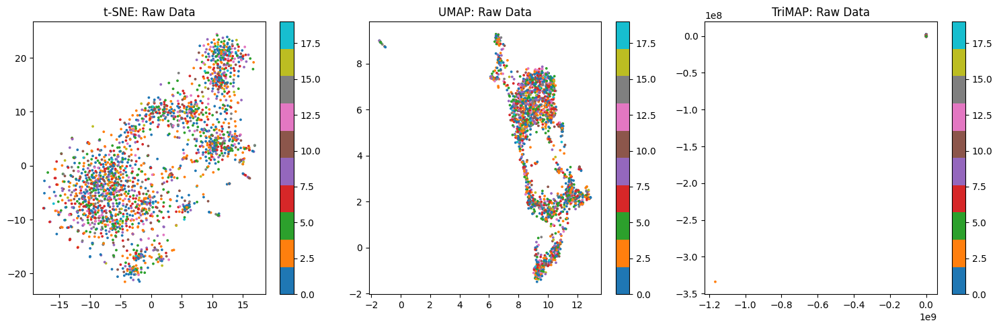

In [ ]:
from sklearn.manifold import TSNE
import umap
import trimap
# Apply t-SNE to raw data
tsne = TSNE(n_components=2, random_state=42)
X_train_tsne = tsne.fit_transform(X_train)
 
# Apply UMAP to raw data
umap_model = umap.UMAP(n_components=2, random_state=42)
X_train_umap = umap_model.fit_transform(X_train)
X_test_umap = umap_model.transform(X_test)
 
# Apply TriMAP to raw data
trimap_model = trimap.TRIMAP(n_dims=2, n_inliers=10, n_outliers=5)
X_train_trimap = trimap_model.fit_transform(X_train)
 
# Visualize the embeddings
plt.figure(figsize=(20, 5))
for i, (embedding, name) in enumerate(zip(
    [X_train_tsne, X_train_umap, X_train_trimap],
    ['t-SNE', 'UMAP', 'TriMAP']
)):
    plt.subplot(1, 4, i+1)
    plt.scatter(embedding[:, 0], embedding[:, 1], c=np.argmax(Y_train, axis=1),
                cmap='tab10', s=3)
    plt.title(f'{name}: Raw Data')
    plt.colorbar()
plt.tight_layout()
plt.show()

/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: inval

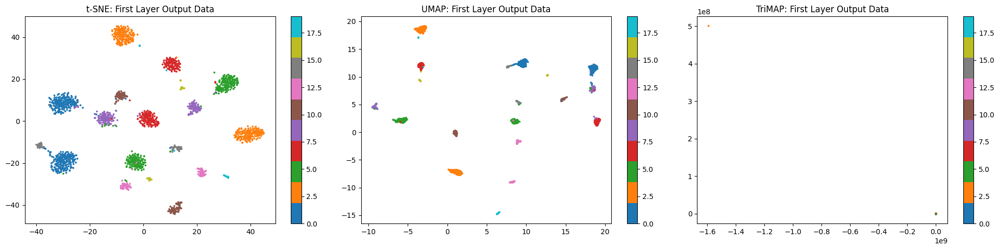

In [7]:
# Apply t-SNE to first layer output data
tf.experimental.numpy.experimental_enable_numpy_behavior()
tsne_layer1 = TSNE(n_components=2, random_state=42)
X_train_tsne_layer1 = tsne_layer1.fit_transform(layer1_output)
 
# Apply UMAP to first layer output data
umap_model_layer1 = umap.UMAP(n_components=2, random_state=42)
X_train_umap_layer1 = umap_model_layer1.fit_transform(layer1_output)
 
# Apply TriMAP to first layer output data
trimap_model_layer1 = trimap.TRIMAP(n_dims=2, n_inliers=10, n_outliers=5)
X_train_trimap_layer1 = trimap_model_layer1.fit_transform(layer1_output)
 
# Visualize the embeddings
plt.figure(figsize=(20, 5))
for i, (embedding, name) in enumerate(zip(
    [X_train_tsne_layer1, X_train_umap_layer1, X_train_trimap_layer1],
    ['t-SNE', 'UMAP', 'TriMAP']
)):
    plt.subplot(1, 3, i+1)
    plt.scatter(embedding[:, 0], embedding[:, 1], c=np.argmax(Y_train, axis=1),
                cmap='tab10', s=3)
    plt.title(f'{name}: First Layer Output Data')
    plt.colorbar()
plt.tight_layout()
plt.show()

Visualizing the embeddings from the hidden layers (especially using methods like UMAP or t-SNE) we can see that the points cluster more tightly compared to when using raw gene expression data. <br>
This is because the network learns biologically meaningful features that disentangle complex gene relationships, making the layer identities more separable.

/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Users/nicolas/studia/I_sem/wdzd/.venv/lib/python3.12/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: inval

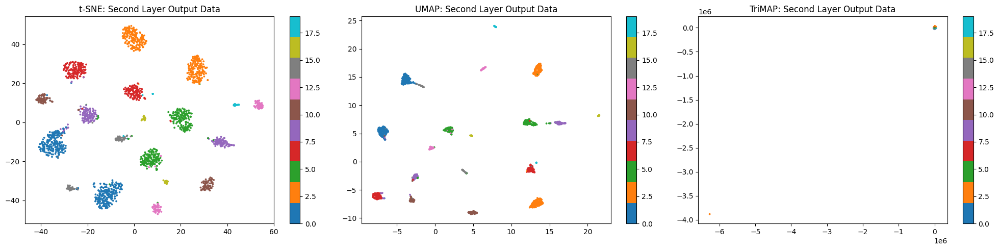

In [8]:
# Apply t-SNE to second layer output data
tf.experimental.numpy.experimental_enable_numpy_behavior()
tsne_layer2 = TSNE(n_components=2, random_state=42)
X_train_tsne_layer2 = tsne.fit_transform(layer2_output)
 
# Apply UMAP to second layer output data
umap_model_layer2 = umap.UMAP(n_components=2, random_state=42)
X_train_umap_layer2 = umap_model_layer2.fit_transform(layer2_output)
 
# Apply TriMAP to second layer output data
trimap_layer2_output = np.ascontiguousarray(layer2_output, dtype=np.float32)
trimap_model_layer2 = trimap.TRIMAP(n_dims=2, n_inliers=10, n_outliers=5)
X_train_trimap_layer2 = trimap_model_layer2.fit_transform(trimap_layer2_output)
 
# Visualize the embeddings
plt.figure(figsize=(20, 5))
for i, (embedding, name) in enumerate(zip(
    [X_train_tsne_layer2, X_train_umap_layer2, X_train_trimap_layer2],
    ['t-SNE', 'UMAP', 'TriMAP']
)):
    plt.subplot(1, 3, i+1)
    plt.scatter(embedding[:, 0], embedding[:, 1], c=np.argmax(Y_train, axis=1),
                cmap='tab10', s=3)
    plt.title(f'{name}: Second Layer Output Data')
    plt.colorbar()
plt.tight_layout()
plt.show()

Second hidden layer does not necesarily show clearer brain region boundaries:<br>
Usually, the second hidden layer tends to capture higher-level abstractions of the data.<br> 
It often provides a more structured representation where different brain regions or cortical layers are not only clustered but also show well-defined separation — indicating that deeper representations emphasize biologically relevant distinctions more clearly.<br>
However it's not the case here. The second Layer Output is very similar to the output of the first layer.

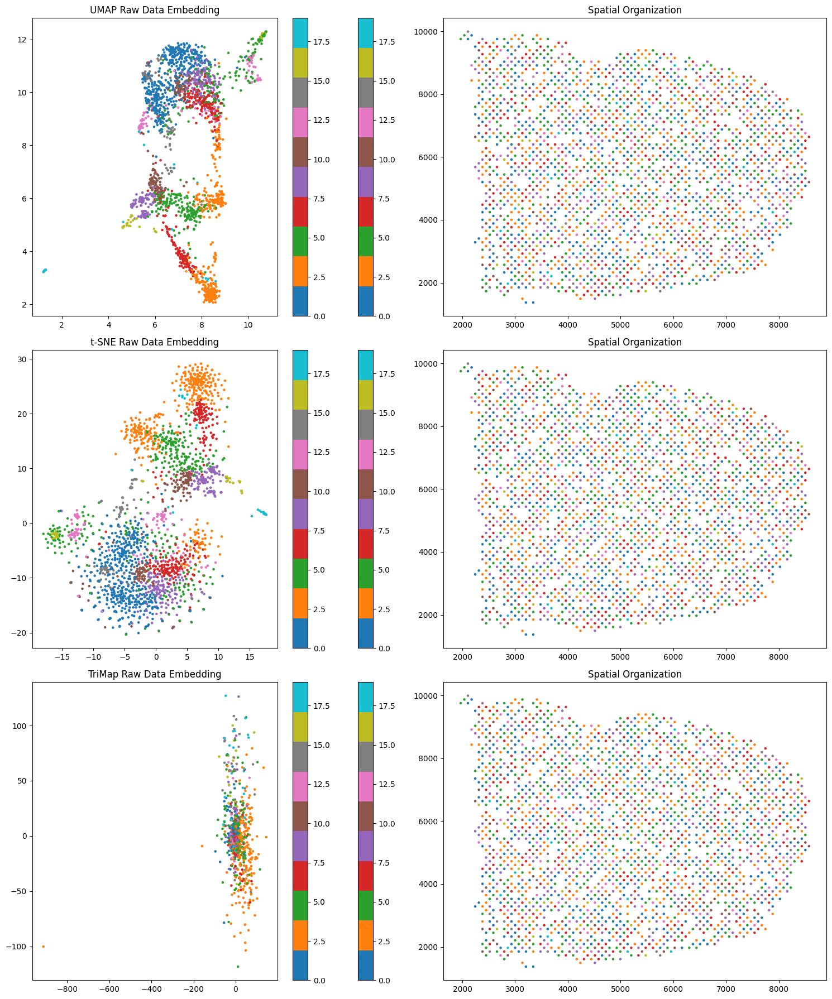

In [9]:
X_train, X_test, y_train, y_test, spatial_train, spatial_test = train_test_split(
    X, y, adata.obsm['spatial'], test_size=0.2, random_state=42, stratify=y
)

# Visualize embeddings in spatial context
def plot_spatial_embedding(umap_embedding,tsne_embedding, trimap_embedding, labels, spatial_coords):
    plt.figure(figsize=(15, 18))
 
    # Display the embedding
    plt.subplot(3, 2, 1)
    scatter = plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1],
                          c=labels, cmap='tab10', s=5)
    plt.title('UMAP Raw Data Embedding')
    plt.colorbar(scatter)
 
    # Display the same points in their spatial locations
    plt.subplot(3, 2, 2)
    plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1],
                c=labels, cmap='tab10', s=5)
    plt.title(f'Spatial Organization')
    plt.colorbar(scatter)

    #t-SNE embedding
    plt.subplot(3, 2, 3)
    scatter = plt.scatter(tsne_embedding[:, 0], tsne_embedding[:, 1],
                          c=labels, cmap='tab10', s=5)
    plt.title('t-SNE Raw Data Embedding')
    plt.colorbar(scatter)

    plt.subplot(3, 2, 4)
    plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1],
                c=labels, cmap='tab10', s=5)
    plt.title(f'Spatial Organization')
    plt.colorbar(scatter)

     #tri-map embedding
    plt.subplot(3, 2, 5)
    scatter = plt.scatter(trimap_embedding[:, 0], trimap_embedding[:, 1],
                          c=labels, cmap='tab10', s=5)
    plt.title('TriMap Raw Data Embedding')
    plt.colorbar(scatter)

    plt.subplot(3, 2, 6)
    plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1],
                c=labels, cmap='tab10', s=5)
    plt.title(f'Spatial Organization')
    plt.colorbar(scatter)
    plt.tight_layout()
    plt.show()
 
# Get spatial coordinates for your spots
y_labels = np.argmax(Y_train, axis=1)
 
# Plot embeddings in spatial context
plot_spatial_embedding(X_train_umap, X_train_tsne, X_train_trimap, y_labels, spatial_train)

In [22]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Define a function to evaluate KNN on different embeddings
def evaluate_knn(X_train_embedded, X_test_embedded, y_train, y_test, n_neighbors_list):
    results = []
    for n_neighbors in n_neighbors_list:
        knn = KNeighborsClassifier(n_neighbors=n_neighbors)
        knn.fit(X_train_embedded, y_train)
        y_pred = knn.predict(X_test_embedded)
        accuracy = accuracy_score(y_test, y_pred)
        results.append((n_neighbors, accuracy))
        print(f"n_neighbors={n_neighbors}, Accuracy: {accuracy:.4f}")
    return results
 
# Convert one-hot encoded labels to class indices
y_train = np.argmax(Y_train, axis=1)
y_test = np.argmax(Y_test, axis=1)
 
# Test KNN with different numbers of neighbors
n_neighbors_list = [3, 5, 10, 100, 1000]
 
print("Raw Data UMAP Embeddings:")
umap_raw_results = evaluate_knn(X_train_umap, X_test_umap, y_train, y_test, n_neighbors_list)
print("\nRaw Data t-SNE Embeddings:")
evaluate_knn(X_train_tsne, X_train_tsne, y_train, y_train, n_neighbors_list)
print("\nRaw Data TriMap Embeddings:")
evaluate_knn(X_train_trimap, X_train_trimap, y_train, y_train, n_neighbors_list)
print()

Raw Data UMAP Embeddings:
n_neighbors=3, Accuracy: 0.1059
n_neighbors=5, Accuracy: 0.0911
n_neighbors=10, Accuracy: 0.0985
n_neighbors=100, Accuracy: 0.0892
n_neighbors=1000, Accuracy: 0.1041

Raw Data t-SNE Embeddings:
n_neighbors=3, Accuracy: 0.4130
n_neighbors=5, Accuracy: 0.3344
n_neighbors=10, Accuracy: 0.2447
n_neighbors=100, Accuracy: 0.1344
n_neighbors=1000, Accuracy: 0.1116

Raw Data TriMap Embeddings:
n_neighbors=3, Accuracy: 0.4093
n_neighbors=5, Accuracy: 0.3200
n_neighbors=10, Accuracy: 0.2558
n_neighbors=100, Accuracy: 0.1307
n_neighbors=1000, Accuracy: 0.1074



In [23]:
X_test_umap_layer1 = umap_model_layer1.transform(X_test)
print("First Layer Output Data UMAP Embeddings:")
evaluate_knn(X_train_umap_layer1, X_test_umap_layer1, y_train, y_test, n_neighbors_list)
print("\nFirst Layer Output Data t-SNE Embeddings:")
evaluate_knn(X_train_tsne_layer1, X_train_tsne_layer1, y_train, y_train, n_neighbors_list)
print("\nFirst Layer Output Data TriMap Embeddings:")
evaluate_knn(X_train_trimap_layer1, X_train_trimap_layer1, y_train, y_train, n_neighbors_list)
print()

First Layer Output Data UMAP Embeddings:
n_neighbors=3, Accuracy: 0.0558
n_neighbors=5, Accuracy: 0.0558
n_neighbors=10, Accuracy: 0.0558
n_neighbors=100, Accuracy: 0.0558
n_neighbors=1000, Accuracy: 0.1078

First Layer Output Data t-SNE Embeddings:
n_neighbors=3, Accuracy: 0.9851
n_neighbors=5, Accuracy: 0.9819
n_neighbors=10, Accuracy: 0.9777
n_neighbors=100, Accuracy: 0.9209
n_neighbors=1000, Accuracy: 0.2279

First Layer Output Data TriMap Embeddings:
n_neighbors=3, Accuracy: 0.6716
n_neighbors=5, Accuracy: 0.6219
n_neighbors=10, Accuracy: 0.5888
n_neighbors=100, Accuracy: 0.5279
n_neighbors=1000, Accuracy: 0.4298



In [25]:
X_test_umap_layer2 = umap_model_layer2.transform(X_test)
print("Second Layer Output Data UMAP Embeddings:")
evaluate_knn(X_train_umap_layer2, X_test_umap_layer2, y_train, y_test, n_neighbors_list)
print("\nSecond Layer Output Data t-SNE Embeddings:")
evaluate_knn(X_train_tsne_layer2, X_train_tsne_layer2, y_train, y_train, n_neighbors_list)
print("\nSecond Layer Output Data TriMap Embeddings:")
evaluate_knn(X_train_trimap_layer2, X_train_trimap_layer2, y_train, y_train, n_neighbors_list)
print()

Second Layer Output Data UMAP Embeddings:
n_neighbors=3, Accuracy: 0.0279
n_neighbors=5, Accuracy: 0.0279
n_neighbors=10, Accuracy: 0.0279
n_neighbors=100, Accuracy: 0.0279
n_neighbors=1000, Accuracy: 0.1097

Second Layer Output Data t-SNE Embeddings:
n_neighbors=3, Accuracy: 0.9842
n_neighbors=5, Accuracy: 0.9795
n_neighbors=10, Accuracy: 0.9767
n_neighbors=100, Accuracy: 0.9181
n_neighbors=1000, Accuracy: 0.2498

Second Layer Output Data TriMap Embeddings:
n_neighbors=3, Accuracy: 0.4912
n_neighbors=5, Accuracy: 0.4423
n_neighbors=10, Accuracy: 0.3707
n_neighbors=100, Accuracy: 0.2921
n_neighbors=1000, Accuracy: 0.1921



Using features from the hidden layers leads to better classification performance than raw input data. <br>
This improvement reflects the network's ability to learn compact, discriminative features that emphasize class-relevant variations while minimizing noise and redundant information.

In [30]:
import squidpy as sq

sq.gr.spatial_neighbors(adata, coord_type='grid')
sq.gr.spatial_autocorr(adata, mode='moran')

Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['moranI']`
Finish (0:00:00)


In [ ]:
moran_res = adata.uns['moranI']
print(moran_res.head())

                I  pval_norm  var_norm  pval_norm_fdr_bh
Mbp      0.788332        0.0  0.000131               0.0
Slc17a7  0.775264        0.0  0.000131               0.0
Nrgn     0.743275        0.0  0.000131               0.0
Cck      0.727492        0.0  0.000131               0.0
Itpka    0.697990        0.0  0.000131               0.0


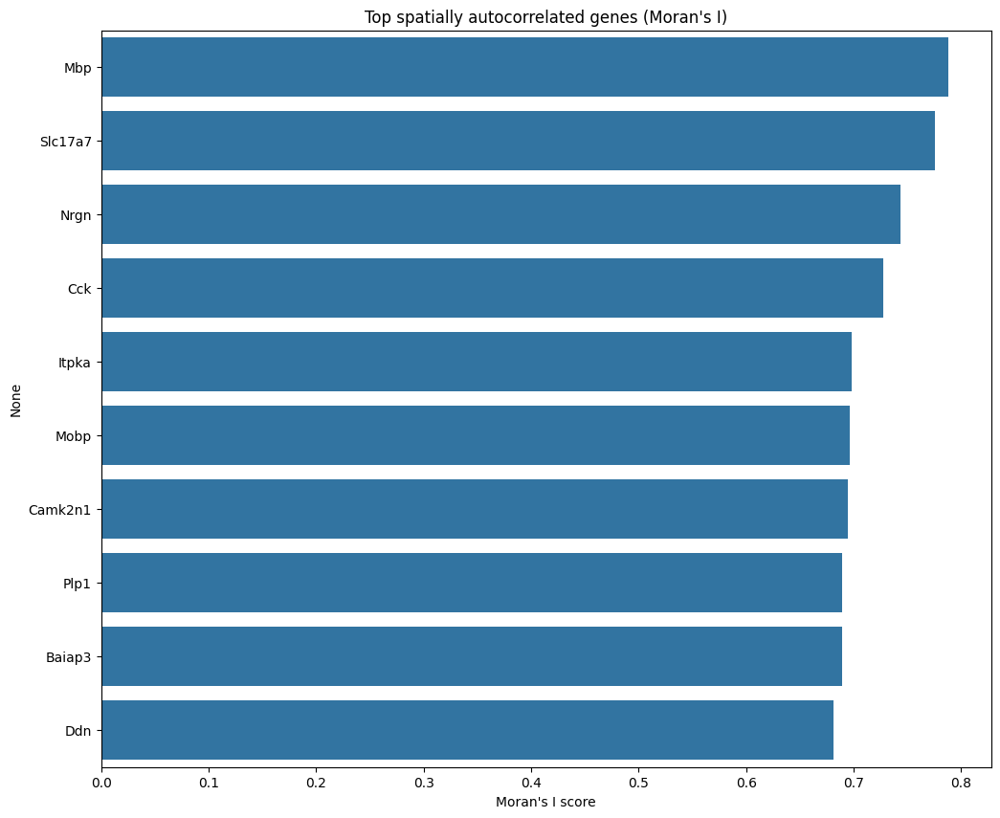

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

top_genes = moran_res.sort_values("I", ascending=False).head(10).index
sns.barplot(data=moran_res.loc[top_genes], x="I", y=moran_res.loc[top_genes].index)
plt.title("Top spatially autocorrelated genes (Moran's I)")
plt.xlabel("Moran's I score")
plt.show()

In [32]:
from scipy import sparse
from scipy.spatial.distance import pdist, squareform
from scipy.stats import spearmanr

# Coordinates and expression vectors
spatial_dist = squareform(pdist(adata.obsm["spatial"]))
expr_dist = squareform(pdist(adata.X.toarray() if sparse.issparse(adata.X) else adata.X))

# Flatten and correlate
r, p = spearmanr(spatial_dist.ravel(), expr_dist.ravel())
print(f"Spearman correlation: {r:.2f}, p={p:.2e}")


Spearman correlation: 0.01, p=1.23e-181


In [35]:
import squidpy as sq

# Precompute spatial graph (if not already done)
sq.gr.spatial_neighbors(adata)

# Calculate Moran’s I for each gene
sq.gr.spatial_autocorr(adata, mode='moran')

# Results are stored in adata.uns['moranI']
moran_df = adata.uns['moranI']
top_genes = moran_df.sort_values(by='I', ascending=False).head(10).index.tolist()


Creating graph using `grid` coordinates and `None` transform and `1` libraries.
Adding `adata.obsp['spatial_connectivities']`
       `adata.obsp['spatial_distances']`
       `adata.uns['spatial_neighbors']`
Finish (0:00:00)
Calculating moran's statistic for `None` permutations using `1` core(s)
Adding `adata.uns['moranI']`
Finish (0:00:00)


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_27960/319574456.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=top_genes, ncols=5, cmap='magma')


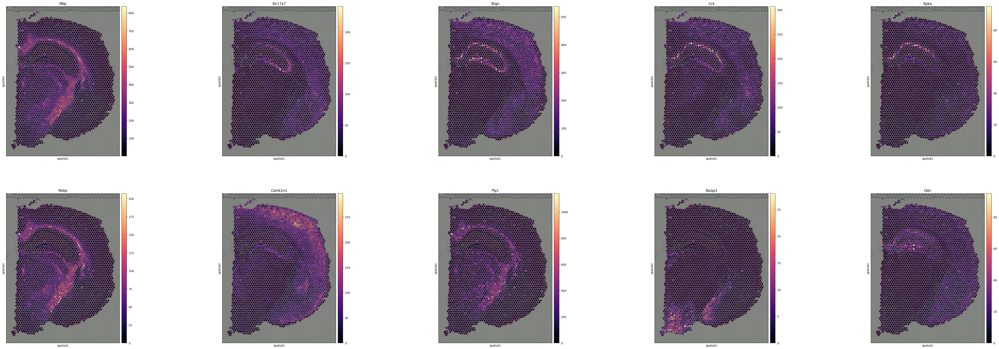

In [ ]:
import scanpy as sc

# Plot spatial tissue image
sc.pl.spatial(adata, color=top_genes, ncols=5, cmap='magma')


computing PCA
    with n_comps=9
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 9
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'spatial_leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/var/folders/8j/_nnvcqj93gvgk18wygygd9tw0000gn/T/ipykernel_27960/772407087.py:10: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='spatial_leiden')


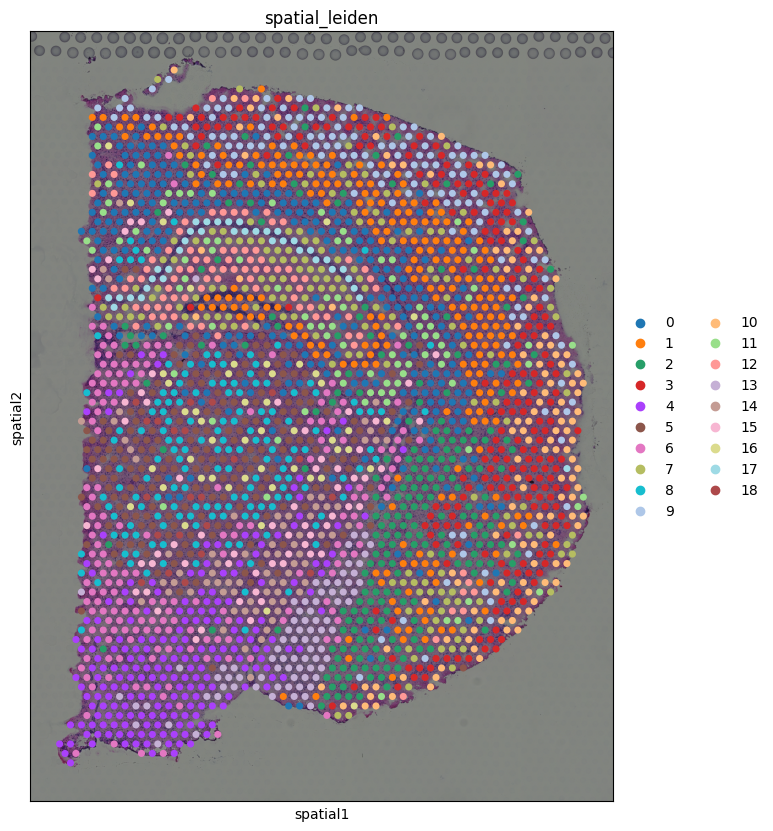

In [37]:
# Restrict to top spatially variable genes
adata.var['highly_variable'] = adata.var_names.isin(top_genes)

# Run neighborhood graph and clustering
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata, key_added='spatial_leiden')

# Visualize
sc.pl.spatial(adata, color='spatial_leiden')
